# Plotting GFS output with numpy arrays extracted from GRIB files

v2.0, 8 april 2022, by Brian Fiedler

Make animations of GFS forecast products like this http://metrprof.xyz/GFSanimator.html

Now using [cartopy](https://scitools.org.uk/cartopy/docs/latest/) for drawing maps. [Basemape is obsolete]( https://matplotlib.org/basemap/).

You will need janim.py, to make the html file that controls the animation of PNG images.

Your [Student Task](#Student-Task) is at the end of this notebook.

Here we plot forecasted fields from the [Global Forecast System](https://www.ncdc.noaa.gov/data-access/model-data/model-datasets/global-forcast-system-gfs).

GFS model output is offered to the public in GRIB files.
Here is a short wikipedia article on [GRIB](https://en.wikipedia.org/wiki/GRIB | GRIB).  See especially "Problems with GRIB". 

The Python [pygrib module](http://www.himpactwxlab.com/home/how-to-wiki/write-grib2-data-with-pygrib) can certainly read GRIB files.  But `pygrib` is not available in the Anaconda distribution. Normally, `pygrib` is compiled for use in  Linux.  There is no way to easy way to use `pygrib` in Windows, as far as I know. But the biggest impediment with using GRIB files containing GFS forecasts is that the files are *very big*.  If you want to plot 3 fields, for example surface pressure, surface winds and 500 mb heights, you will be downloading a GRIB file with approximately 300 fields. 

This [GRIB repository](https://nomads.ncep.noaa.gov/pub/data/nccf/com/gfs/prod/ ) is the one where my website grabs the latest GFS forecast files.  Alternative repositories exist.  Note the GFS ouput is available in [various resolutions](http://www.nco.ncep.noaa.gov/pmb/docs/on388/tableb.html), with model output data thinned to 2.5 deg, 1.0 deg and 0.5 deg, as well as (apparently) the raw model output at 0.25 deg.

[gfs1deg](http://metrprof.xyz/gfs1deg/) is where I transfer the 1.0 deg GRIB files. For the purpose of limiting the expense of online storage and transfer, only the forecasts initialized at 0Z and 12 Z are stored.  Also, the forecasts are stored in 12 hour increments.

[gfs1degnyp](http://metrprof.xyz/gfs1degnpy/) is where I place individual `.npy` files that are extracted from the GRIB files.  

Here we exploit the ability of `numpy` to easily store and load inidiviual numpy arrays in files.  For example:
```
import numpy as np
myarray = np.arange(100.)
np.save("myarray.npy",myarray)
```
And then, on some other computer, perhaps with a different operating system:
```
import numpy as np
myarray = np.load("myarray.npy")
```

The file `myarray.npy` can be shared across OS because it contains a short header that describes the byte order,  [the big-endian little-endian business](http://searchnetworking.techtarget.com/definition/big-endian-and-little-endian) (if you care about that).  The files also contain the numpy specific things, such as the shape of the numpy array. But not much else.  The drawback of distributing data by `.npy` files is that they are not self-describing.  The contents will need to be described by the filename, the directory structure where the file is placed, and accompanying documentation.

Ready to try it?  Go to [gfs1degnyp](http://metrprof.xyz/gfs1degnpy/) and download a `prmsl0.npy` file.
Then open a new ipython notebook and execute these 5 lines:
```
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
prmsl = np.load('prmsl0.npy')
plt.imshow(prmsl)
```


In [2]:
%%html
<style> div.text_cell_render{background-color: #ded; font-size: 18px}
                    .rendered_html code {background-color: #ded; color: #900; font-size: 16px}
                    .rendered_html pre {background-color: #ded; color: #900; font-size: 16px} 
</style>

In [3]:
import warnings
#warnings.filterwarnings('ignore') # prevents some matplotlib warnings
#import urllib.request # not used here, because we access password-protected files
import requests, shutil # alternative to urllib, easier with password-protected files
import glob, os
import janim # https://code.activestate.com/recipes/580675-makes-html-with-javascript-to-animate-a-sequence-o
import numpy as np
from datetime import datetime, timedelta # date and time helpers
from IPython.display import display,clear_output
from IPython.core.display import HTML, Image
import time as Time
import math
import matplotlib.pyplot as plt
%matplotlib inline
from matplotlib import collections  as mc
import cartopy.crs as ccrs

In [4]:
urlfront = "http://metrprof.xyz/"
username = "*****" #available from instructor
password = "*****" #available from instructor
npydir = "gfs1degnpy"

In [5]:
# This downloads the npy file arrays that we want, and stores them locally.
# For example if filepath="gfs1degnpy/2016091500/f000/lsm0.npy",
# gfsload will check if we have the file, if not it will be downloaded from
# http://metr4330.net/2016091500/f000/lsm0.npy
def gfsload(filepath):
    if not os.path.exists(filepath):
        dirpath = os.path.dirname(filepath)
        if not os.path.exists(dirpath): os.makedirs(dirpath)
        urlpath = urlfront+filepath
        try:
            # urllib.request.urlretrieve(urlpath,filepath) # urllib works only if no password
            
            # we do this http://stackoverflow.com/a/39217788/1281323
            r = requests.get(urlpath,stream=True,auth=(username, password))
            with open(filepath, 'wb') as f:
                shutil.copyfileobj(r.raw, f)
                               
            if os.path.getsize(filepath)<1000:
                os.remove(filepath)
                print("downloaded an error message, now removed")
            else:
                print("successfully downloaded file at",urlpath)
        except:
            print("big problem retrieving ",urlpath)
    try:
        return np.load(filepath) # load download file into numpy array, and return
    except:
        print("cannot give you the numpy array")
        return

In [6]:
nowtime = datetime.utcnow() # current time from your computer
print("time now:", nowtime)
if nowtime.hour > 18: 
    gfstime = nowtime.replace(hour=18)
elif nowtime.hour > 12: 
    gfstime = nowtime.replace(hour=12)
elif nowtime.hour > 6: 
    gfstime = nowtime.replace(hour=6)
else:
    gfstime = nowtime.replace(hour=0)
timedir = gfstime.strftime("%Y%m%d%H")
print("hope GFS forecasts exist from this timestamp:", timedir)

time now: 2024-08-22 18:03:47.002138
hope GFS forecasts exist from this timestamp: 2024082212


In [7]:
Readmelink = urlfront +  npydir + '/'+ timedir+ '/f180/Readme.txt'
Readmefile = requests.get(Readmelink,auth=(username, password))
if Readmefile.status_code != 200: # forecast not online yet, need to fall back by 6 hours
    print("No file in ",timedir)
    gfstime = gfstime + timedelta(hours=-6)
    timedir = gfstime.strftime("%Y%m%d%H")
    print("Fallback to earlier timedir", timedir)
    Readmelink = urlfront +  npydir + '/'+ timedir+ '/f180/Readme.txt'
    Readmefile = requests.get(Readmelink,auth=(username, password))
if Readmefile.status_code != 200: # forecast not online yet, need to fall back ANOTHER 6 hours
    print("No file in ",timedir)
    gfstime = gfstime + timedelta(hours=-6)
    timedir = gfstime.strftime("%Y%m%d%H")
    print("Fallback to earlier timedir", timedir)
    Readmelink = urlfront +  npydir + '/'+ timedir+ '/f180/Readme.txt'
    Readmefile = requests.get(Readmelink,auth=(username, password))
    
print(Readmelink)

print("\nThe .npy file name indicates the array name to use:\n")
print(Readmefile.content.decode())

No file in  2024082212
Fallback to earlier timedir 2024082206
http://metrprof.xyz/gfs1degnpy/2024082206/f180/Readme.txt

The .npy file name indicates the array name to use:

prmsl0.npy 1:Pressure reduced to MSL:Pa (instant):regular_ll:meanSea:level 0:fcst time 180 hrs:from 202408220600
gh200.npy 253:Geopotential Height:gpm (instant):regular_ll:isobaricInhPa:level 20000 Pa:fcst time 180 hrs:from 202408220600
t200.npy 254:Temperature:K (instant):regular_ll:isobaricInhPa:level 20000 Pa:fcst time 180 hrs:from 202408220600
r200.npy 255:Relative humidity:% (instant):regular_ll:isobaricInhPa:level 20000 Pa:fcst time 180 hrs:from 202408220600
w200.npy 258:Vertical velocity:Pa s**-1 (instant):regular_ll:isobaricInhPa:level 20000 Pa:fcst time 180 hrs:from 202408220600
u200.npy 260:U component of wind:m s**-1 (instant):regular_ll:isobaricInhPa:level 20000 Pa:fcst time 180 hrs:from 202408220600
v200.npy 261:V component of wind:m s**-1 (instant):regular_ll:isobaricInhPa:level 20000 Pa:fcst time 180

In [8]:
# the fields we want:
grids = 'lsm0 u1 v1 t1 u500 v500 gh500 gh200 prmsl0'.split()

In [9]:
# the forecast times we want:
ftimes = 'f000 f012  f024 f036 f048 f060 f072 f084 f096 f108 f120 f132 f144 f156 f168 f180'.split()

In [10]:
# load all the fields, for all forecast times, into a Python dictionary
gfs={}
if not timedir in gfs: gfs[timedir]={}
for ftime in ftimes:
    if not ftime in gfs[timedir]: gfs[timedir][ftime]={}
    for var in grids:
        npy = npydir + '/' + timedir +'/' + ftime + '/' + var+'.npy'
        print(npy)
        gfs[timedir][ftime][var] = gfsload(npy)

gfs1degnpy/2024082206/f000/lsm0.npy
successfully downloaded file at http://metrprof.xyz/gfs1degnpy/2024082206/f000/lsm0.npy
gfs1degnpy/2024082206/f000/u1.npy
successfully downloaded file at http://metrprof.xyz/gfs1degnpy/2024082206/f000/u1.npy
gfs1degnpy/2024082206/f000/v1.npy
successfully downloaded file at http://metrprof.xyz/gfs1degnpy/2024082206/f000/v1.npy
gfs1degnpy/2024082206/f000/t1.npy
successfully downloaded file at http://metrprof.xyz/gfs1degnpy/2024082206/f000/t1.npy
gfs1degnpy/2024082206/f000/u500.npy
successfully downloaded file at http://metrprof.xyz/gfs1degnpy/2024082206/f000/u500.npy
gfs1degnpy/2024082206/f000/v500.npy
successfully downloaded file at http://metrprof.xyz/gfs1degnpy/2024082206/f000/v500.npy
gfs1degnpy/2024082206/f000/gh500.npy
successfully downloaded file at http://metrprof.xyz/gfs1degnpy/2024082206/f000/gh500.npy
gfs1degnpy/2024082206/f000/gh200.npy
successfully downloaded file at http://metrprof.xyz/gfs1degnpy/2024082206/f000/gh200.npy
gfs1degnpy/20240

In [11]:
#ltime is "latest time". (Should be identical with timedir)
ltime = sorted(gfs)[-1]
print(ltime, timedir)

2024082206 2024082206


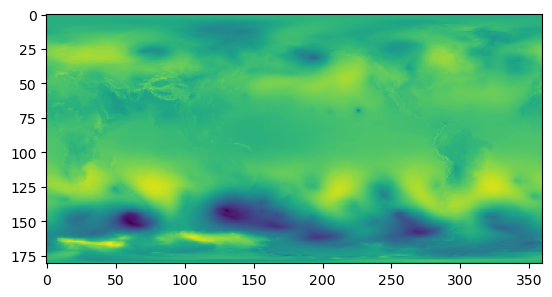

In [12]:
prmsl = gfs[ltime]['f180']['prmsl0']
plt.imshow(prmsl); # quick look at an array

In [13]:
if prmsl.shape[0]==181: #this is GFS one-degree grid
    lons = np.arange(0.,359.1,1)
    lats = np.arange(90,-90.1,-1)
lonsa,latsa = np.meshgrid(lons,lats)
print(lons.shape,lonsa.shape)

(360,) (181, 360)


In [14]:
a = gfs[ltime]['f000'] # 
sorted(a)

['gh200', 'gh500', 'lsm0', 'prmsl0', 't1', 'u1', 'u500', 'v1', 'v500']

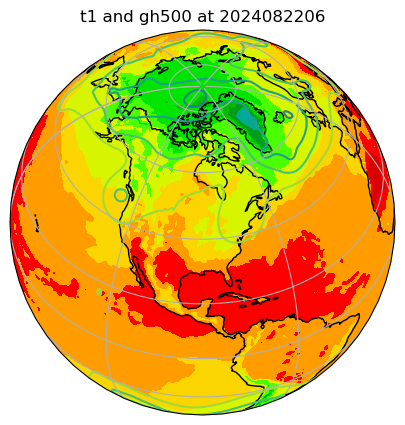

In [15]:
fig = plt.figure(figsize=(5, 5))
ax = fig.add_subplot(1, 1, 1, projection=ccrs.Orthographic(-90,45))
# use either lonsa latsa, or lons lats
ax.contourf(lons, lats, a['t1'],
                transform=ccrs.PlateCarree(),
                cmap='nipy_spectral',levels=15)
ax.contour(lonsa,latsa,a['gh500'],transform=ccrs.PlateCarree())
plt.title('t1 and gh500 at '+str(ltime))

ax.coastlines()
ax.gridlines()
ax.set_global()
#plt.show()

# Make a mask to thin vector plotting

The GFS data is distributed at 1 degree increments in longitude, and so is very crowded at the poles.
We need to make a numpy masked array to filter out the vectors that we don't want to plot.

In [17]:
u1 = a['u1'] 
v1 = a['v1']

skip=4
strt=skip//2
lonsb=lonsa[strt::skip,strt::skip]
latsb=latsa[strt::skip,strt::skip]
u=u1[strt::skip,strt::skip]
v=v1[strt::skip,strt::skip]

coslat = np.cos(np.pi*latsb/180.)
REarth = 6.37e6
dlondt = u/coslat #/REarth
dlatdt = v #/REarth
dt=.2
lone=lonsb+dt*dlondt
late=latsb+dt*dlatdt

p1=zip(lonsb.flatten().tolist(),latsb.flatten().tolist()) 
p2=zip(lone.flatten().tolist(),late.flatten().tolist())
lines=list(zip(p1,p2))
print("number of vectors:",len(lines))

number of vectors: 4050


In [18]:
curlat=91
lc=0
linesthinned=[]
dotslon=[]
dotslat=[]
for line in lines:
    thelat=line[0][1]
    lc+=1
    if thelat<curlat:
        lc=0
        curlat=thelat
        iskip=int(1//math.cos(math.radians(curlat)))
        print(curlat,iskip)
    if lc%iskip!=0: continue
    linesthinned.append(line)
    dotslon.append(line[1][0])
    dotslat.append(line[1][1])
print("original number:",len(lines),"   after thinning:",len(linesthinned))

88.0 28
84.0 9
80.0 5
76.0 4
72.0 3
68.0 2
64.0 2
60.0 1
56.0 1
52.0 1
48.0 1
44.0 1
40.0 1
36.0 1
32.0 1
28.0 1
24.0 1
20.0 1
16.0 1
12.0 1
8.0 1
4.0 1
0.0 1
-4.0 1
-8.0 1
-12.0 1
-16.0 1
-20.0 1
-24.0 1
-28.0 1
-32.0 1
-36.0 1
-40.0 1
-44.0 1
-48.0 1
-52.0 1
-56.0 1
-60.0 1
-64.0 2
-68.0 2
-72.0 3
-76.0 4
-80.0 5
-84.0 9
-88.0 28
original number: 4050    after thinning: 3140


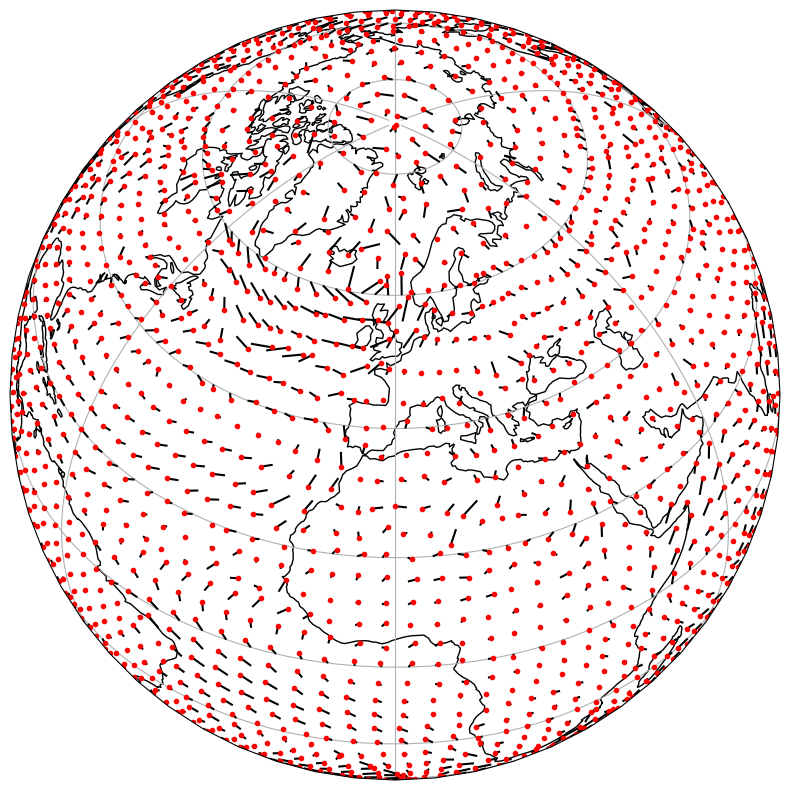

In [19]:
fig2= plt.figure(figsize=(10, 10))
ax2 = fig2.add_subplot(1, 1, 1, projection=ccrs.Orthographic(0,45))
ax2.coastlines()
ax2.set_global()
ax2.gridlines(zorder=0)
lc = mc.LineCollection(linesthinned,color='black',transform=ccrs.PlateCarree())
ax2.add_collection(lc)
ax2.plot(dotslon,dotslat,'r.',transform=ccrs.PlateCarree());

# Produce some detailed plots, to animate

In [21]:
# for combining time stamp and forecast hour into a validation time
def uptime(ts, dhr=0):
    year=int( ts[:4] )
    month=int(ts[4:6])
    day=int(ts[6:8])
    hr=int(ts[8:])
    uptime = datetime(year,month,day,hr) + timedelta(hours=dhr)
    return uptime 

In [22]:
uptime_test = uptime(ltime,dhr=48)

In [23]:
uptime_test.strftime("%Y %m %d %H") # useful for labels in a plot

'2024 08 24 06'

In [24]:
def my_cool_plot(timedir,ftime,showit=False):
    figsur= plt.figure(figsize=(10, 10))
    ax2 = figsur.add_subplot(1, 1, 1, projection=ccrs.Orthographic(-100,35))
    ax3 = figsur.add_axes([0.8, 0.05, 0.15, .2]) # for colorbar
    ax3.axis('off')
    a = gfs[timedir][ftime]

    CF=ax2.contourf( lonsa, latsa, a['prmsl0']/100,
                   levels=[950,960,970,980,990,1000,1010,1020,1030,1040,1050], cmap='nipy_spectral', transform=ccrs.PlateCarree()) #,
                  # colors=['purple']*6+['darkgreen']*5)
    
    CC500 = ax2.contour( lonsa, latsa, a['gh500']/10.,colors='darkgreen',linewidths=3,transform=ccrs.PlateCarree())
    fmtc="%4.0d"
    ##plt.clabel(CC500, fontsize=12, inline=1,fmt=fmtc)
    
    CC200 = ax2.contour( lonsa, latsa, a['gh200']/10.,colors='darkred',linewidths=3,transform=ccrs.PlateCarree())
    ##plt.clabel(CC200, fontsize=12, inline=1,fmt=fmtc) 
    
    u1 = a['u1'] 
    v1 = a['v1']

    # skip some u,v data.  Certainly skip the u,v at the poles!
    skip=4
    strt=skip//2
    lonsb=lonsa[strt::skip,strt::skip]
    latsb=latsa[strt::skip,strt::skip]
    u=u1[strt::skip,strt::skip]
    v=v1[strt::skip,strt::skip]

    # calculate displacement vectors:
    coslat = np.cos(np.pi*latsb/180.)
    REarth = 6.37e6
    dlondt = u/coslat #/REarth # no need to divide by REarth
    dlatdt = v  #/REarth
    dt=.2 # this means u = 1 m/s at the equator moves dt degrees longitude
    lone=lonsb+dt*dlondt # longitude end point of vector
    late=latsb+dt*dlatdt # latitude end point of vector

    p1=zip(lonsb.flatten().tolist(),latsb.flatten().tolist()) 
    p2=zip(lone.flatten().tolist(),late.flatten().tolist())
    lines=list(zip(p1,p2))
    
    curlat=91 
    lc=0
    linesthinned=[]
    dotslon=[]
    dotslat=[]
    for line in lines:
        thelat=line[0][1]
        lc+=1
        if thelat<curlat:
            lc=0
            curlat=thelat
            iskip=int(1//math.cos(math.radians(curlat)))
            #print(curlat,iskip)
        if lc%iskip!=0: continue
        linesthinned.append(line)
        dotslon.append(line[1][0])
        dotslat.append(line[1][1])
    
    lc = mc.LineCollection(linesthinned,color='black',transform=ccrs.PlateCarree())
    ax2.add_collection(lc)
    ax2.plot(dotslon,dotslat,'m.',transform=ccrs.PlateCarree())
    
    vtime = uptime(timedir , int(ftime[1:]) )
    vtimestamp = vtime.strftime("%Y %m %d %H")
    #titl = "%s, valid %4.0d %2.0d %2.0d %2.0d " % (ftime, vtime.year, vtime.month, vtime.day, vtime.hour)
    titl = "%s valid:   %s" % (ftime, vtimestamp)
    ax2.set_title(titl,fontsize=24)
    
    ax2.coastlines()
    ax2.gridlines()
    ax2.set_global()
    
    cbar = plt.colorbar(CF,ax=ax3)#,fraction=0.3) # use matplotlib colorbar
    cbar.set_label( 'prmsl (hPa)' )
    cbar_exists = True

    pngdir = 'pngs/'+str(timedir)
    if not os.path.exists(pngdir): os.makedirs(pngdir)
    pngname = ftime + '.png'
    pngpath = pngdir + '/' + pngname
    fc = '#ddffdd'
    if ftime=='f000': fc='lightgrey'
    figsur.savefig( pngpath, facecolor=fc )
    plt.show()    
    return pngpath

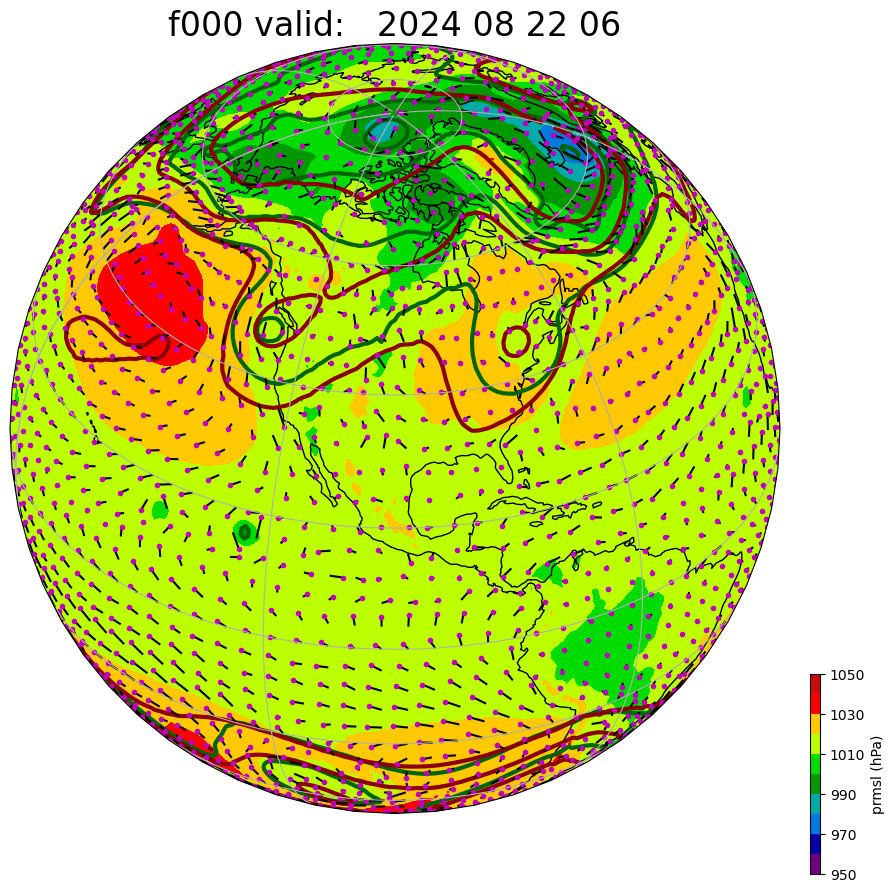

'pngs/2024082206/f000.png'

In [25]:
my_cool_plot(ltime,'f000',showit=True)

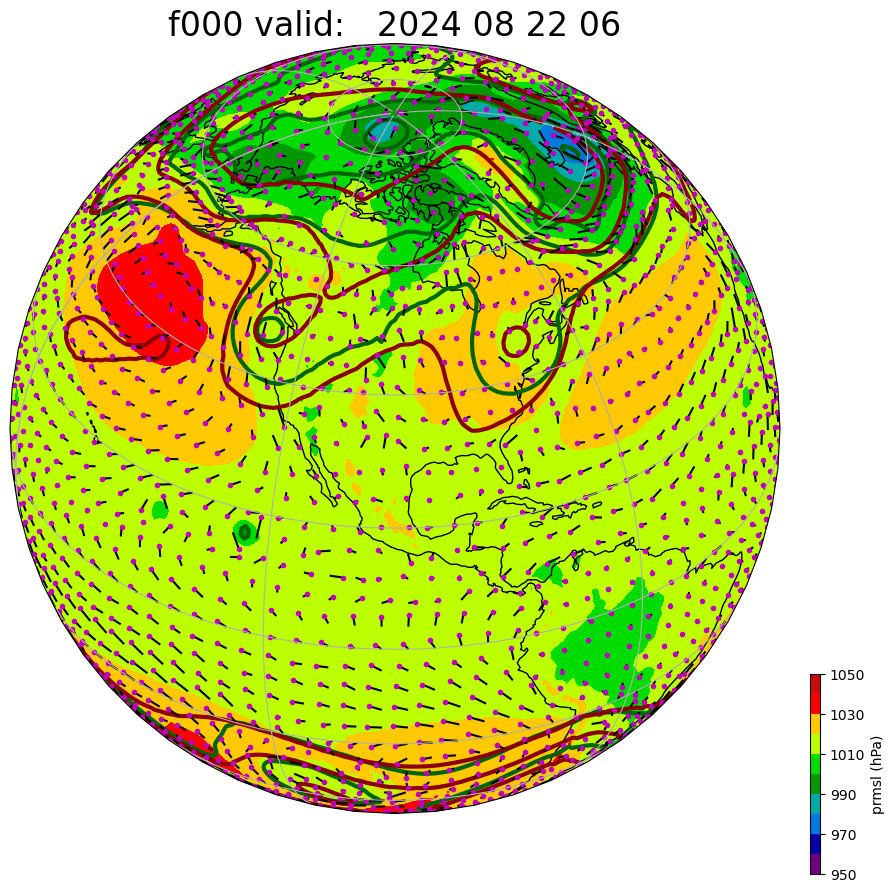

pngs/2024082206/f000.png


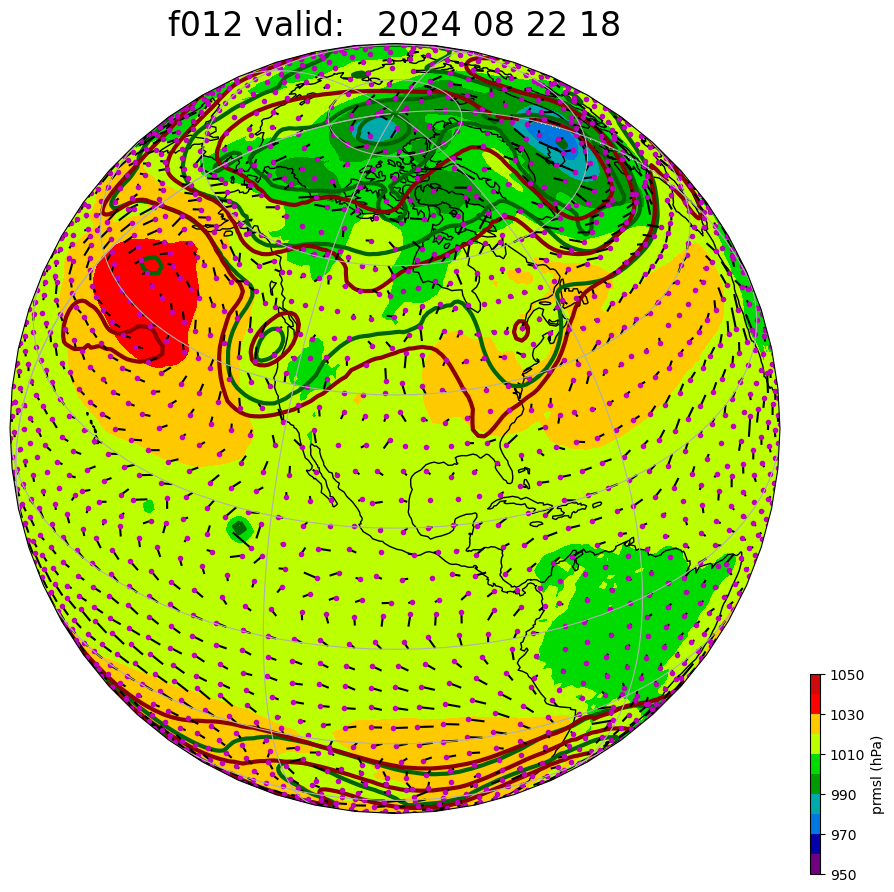

pngs/2024082206/f012.png


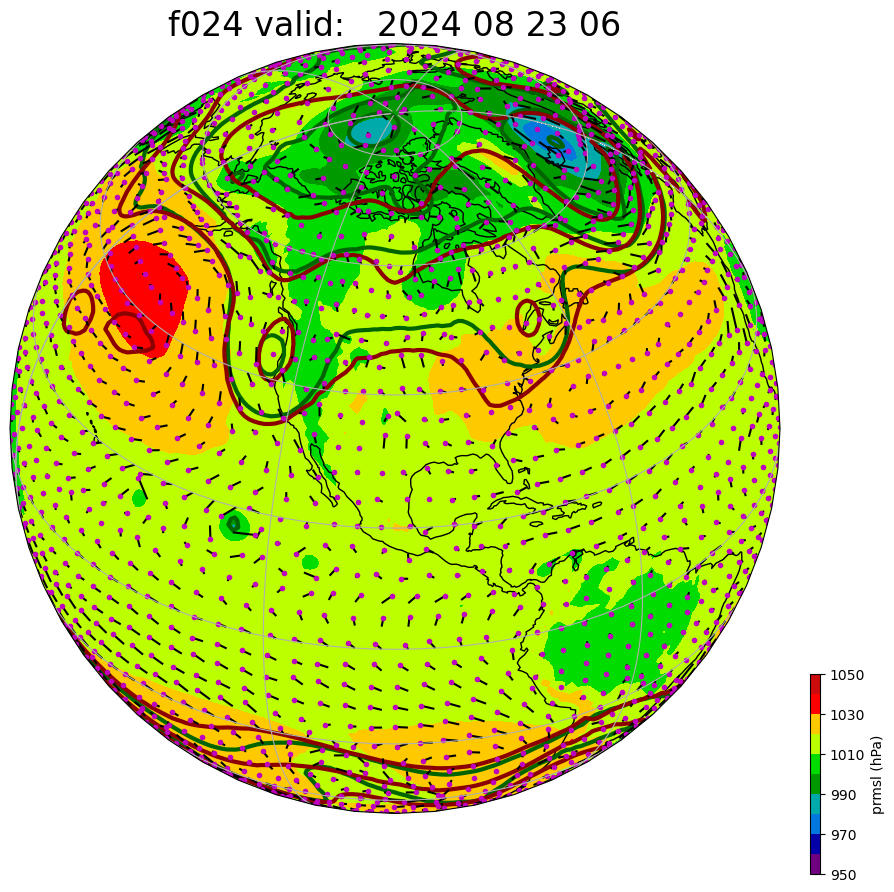

pngs/2024082206/f024.png


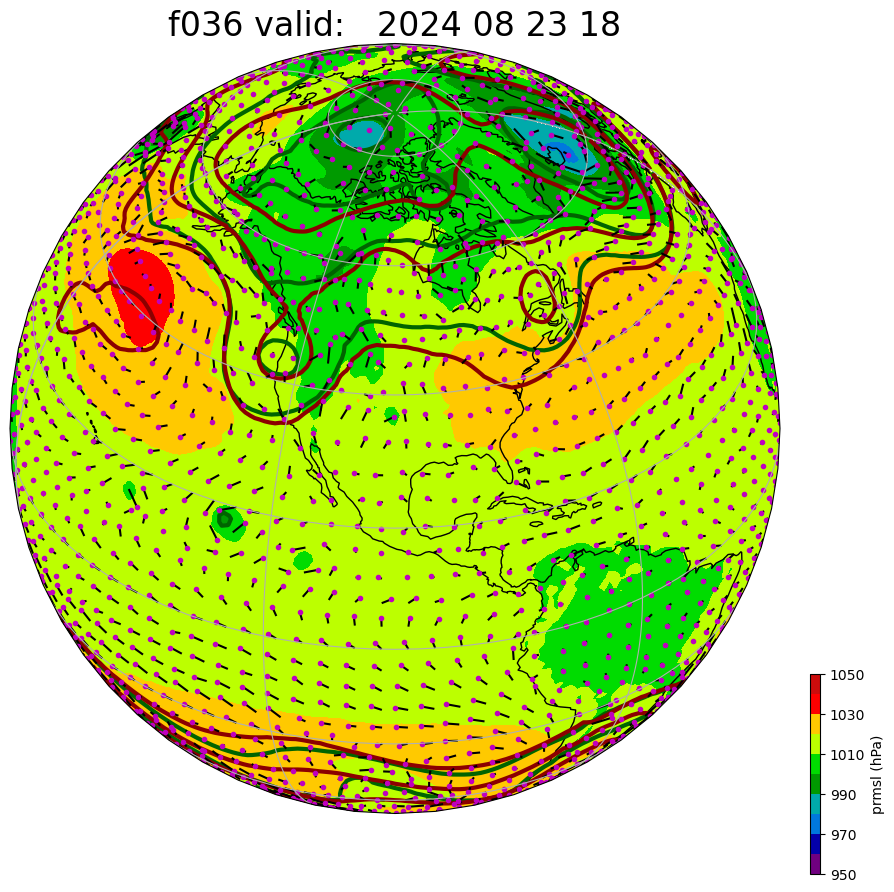

pngs/2024082206/f036.png


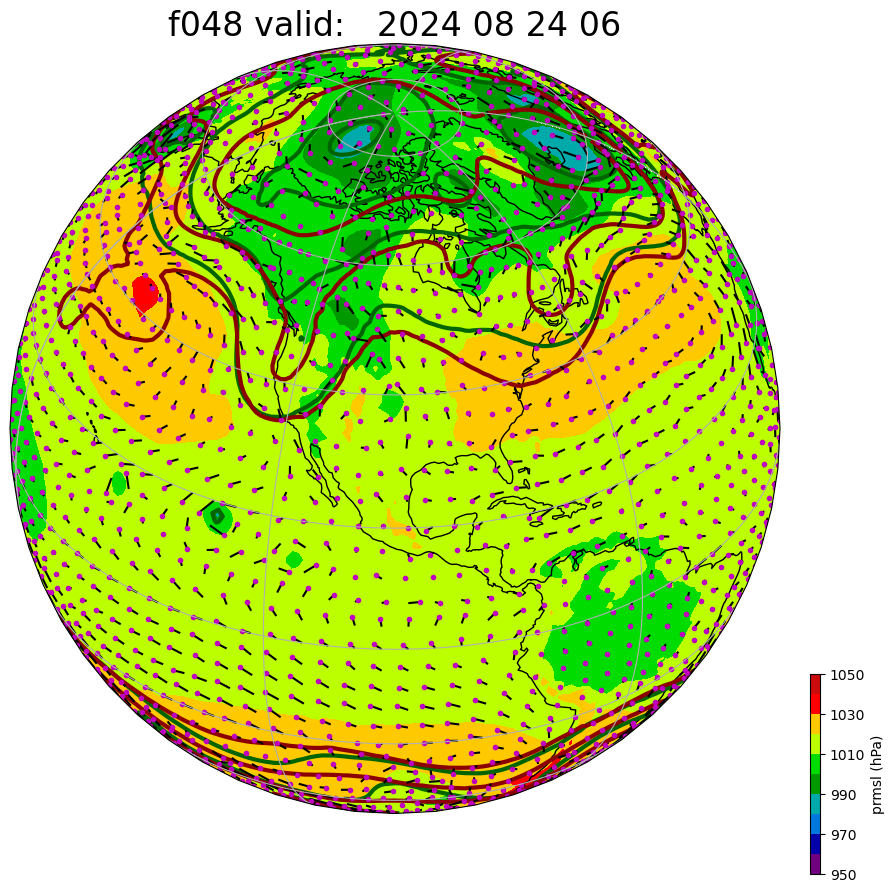

pngs/2024082206/f048.png


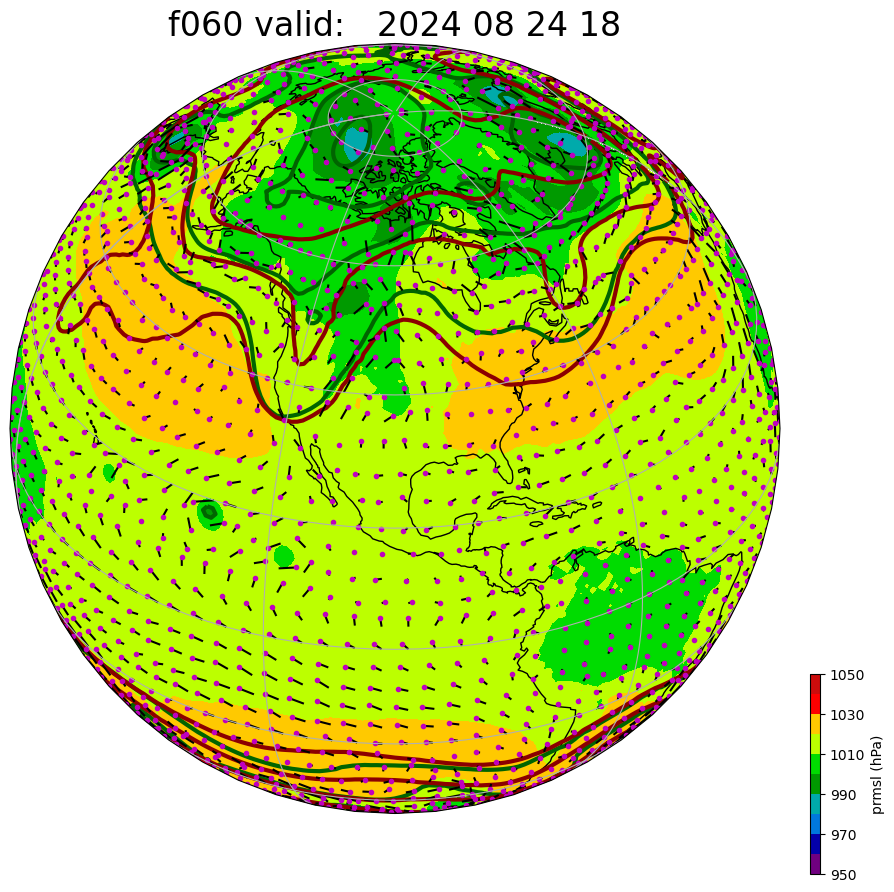

pngs/2024082206/f060.png


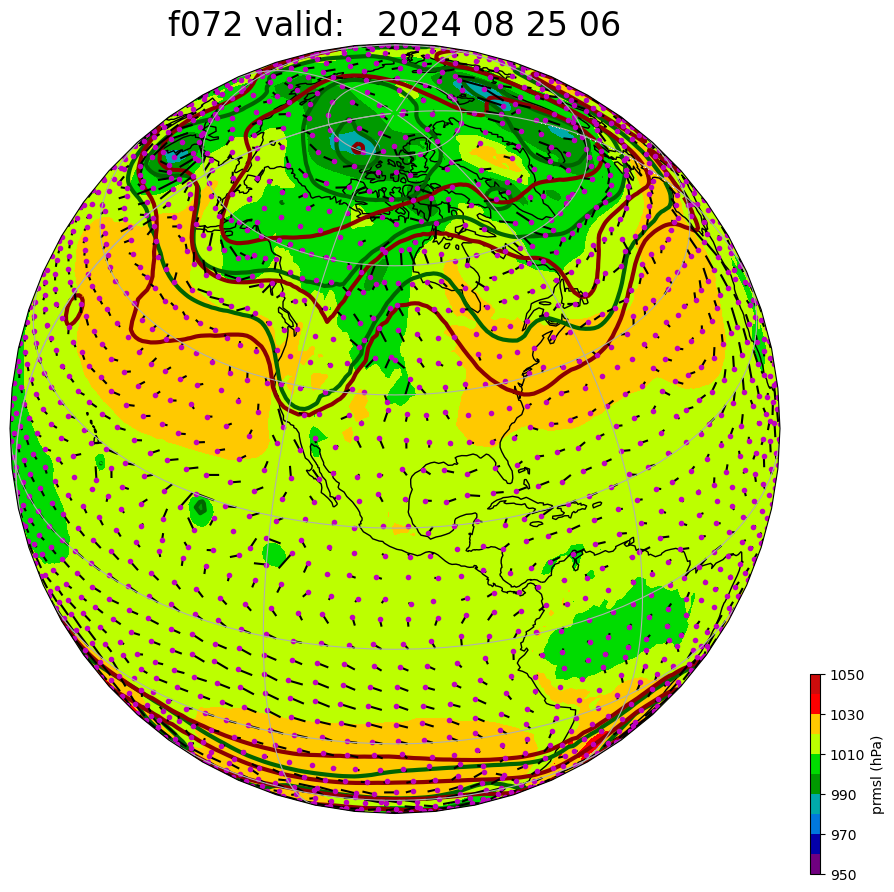

pngs/2024082206/f072.png


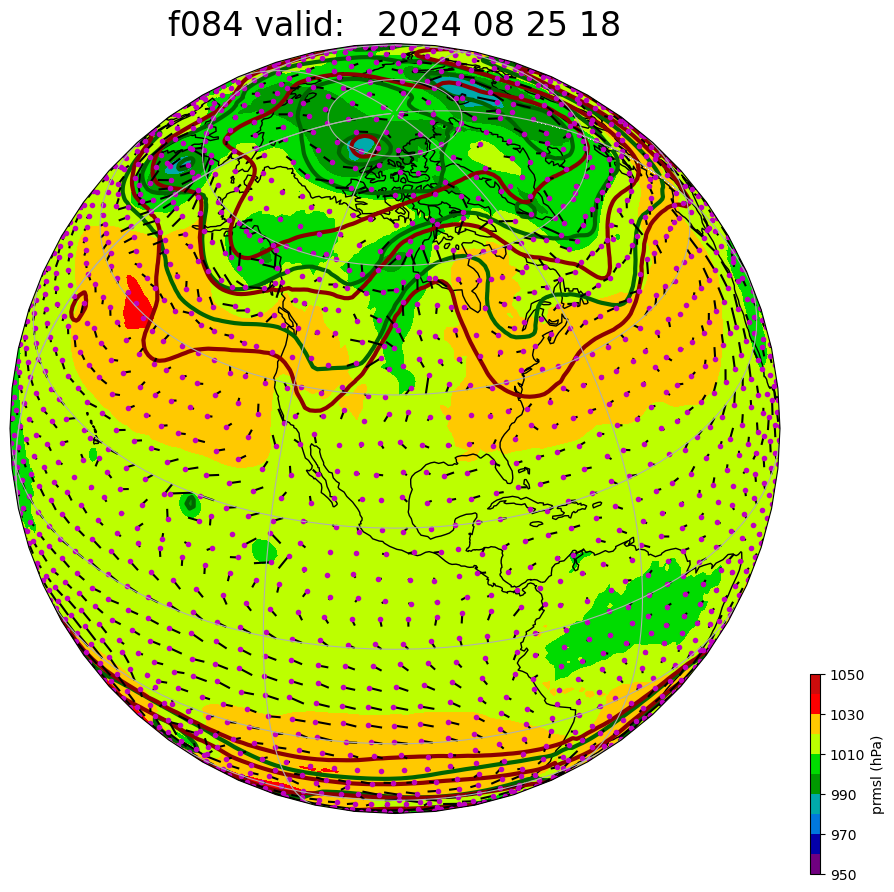

pngs/2024082206/f084.png


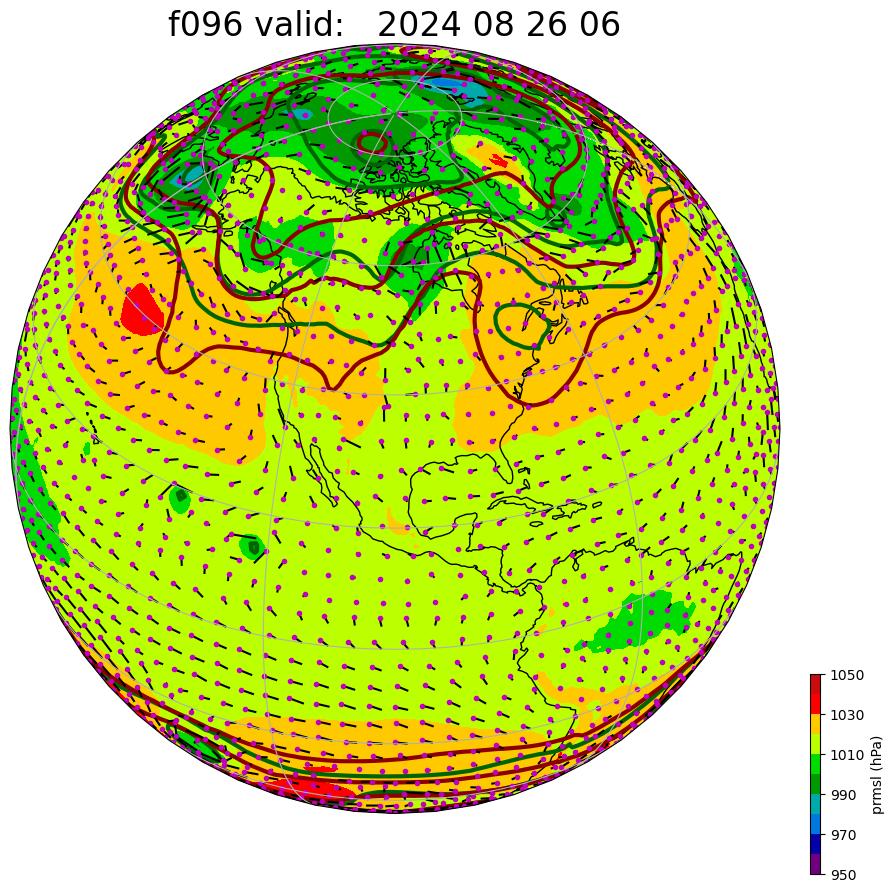

pngs/2024082206/f096.png


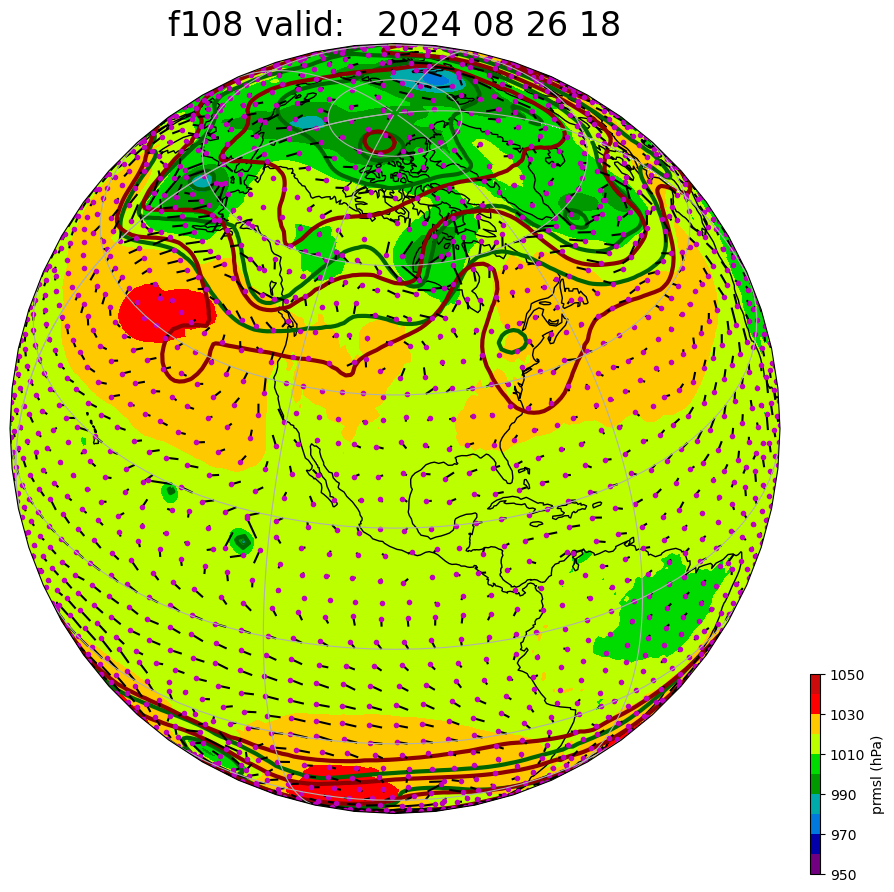

pngs/2024082206/f108.png


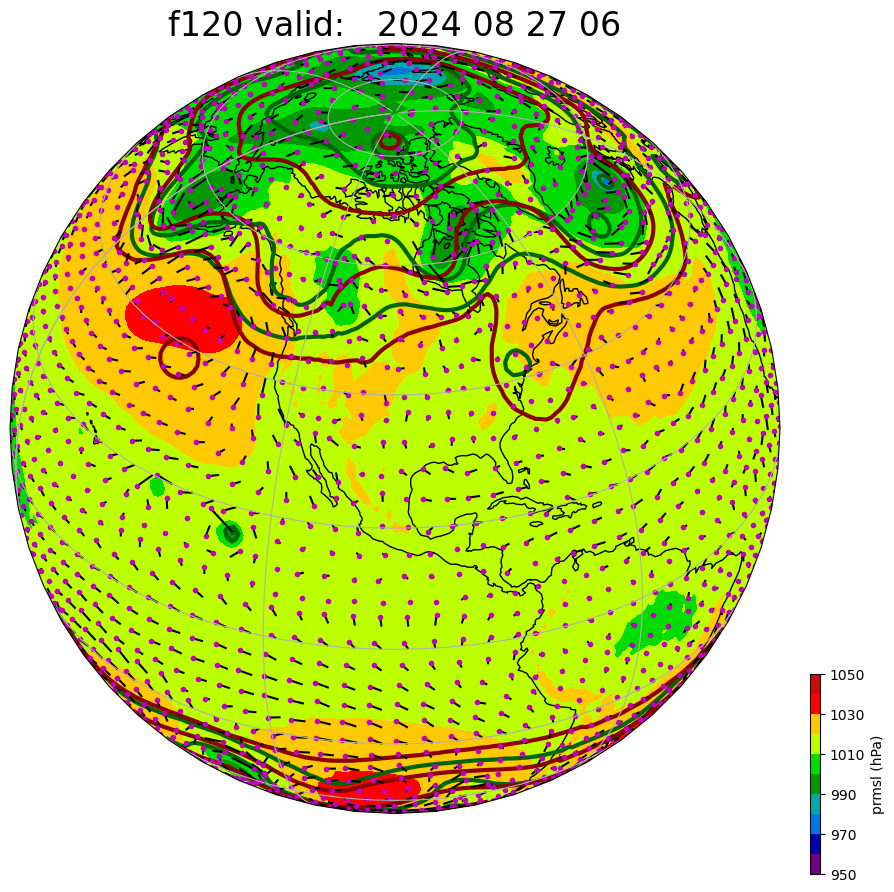

pngs/2024082206/f120.png


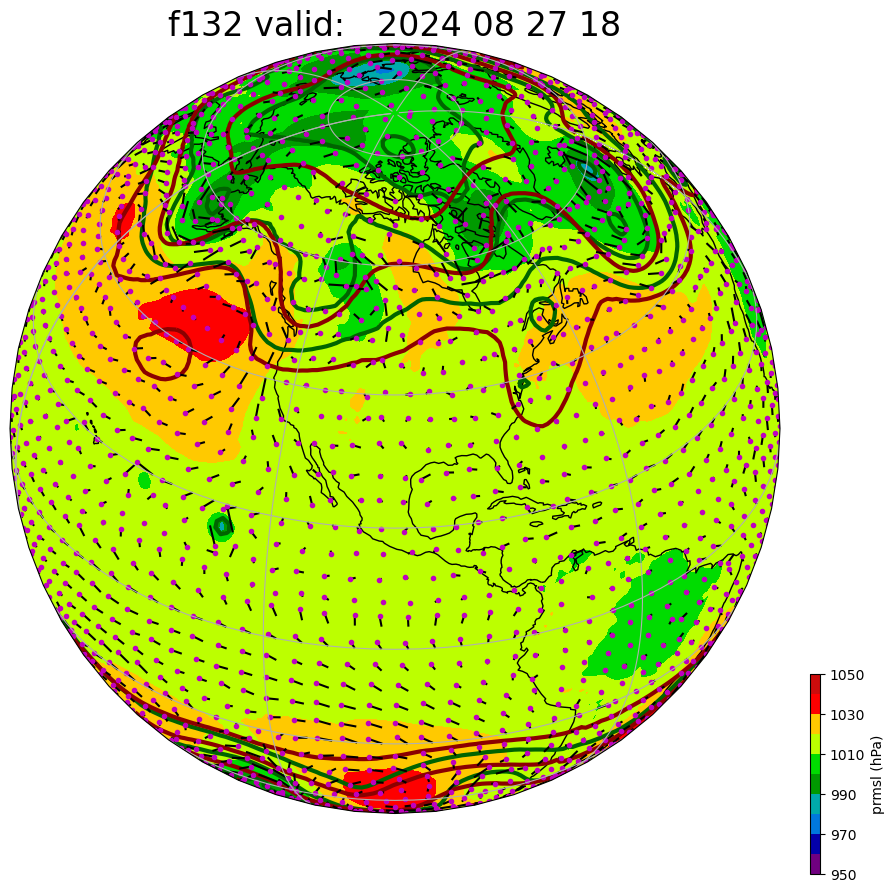

pngs/2024082206/f132.png


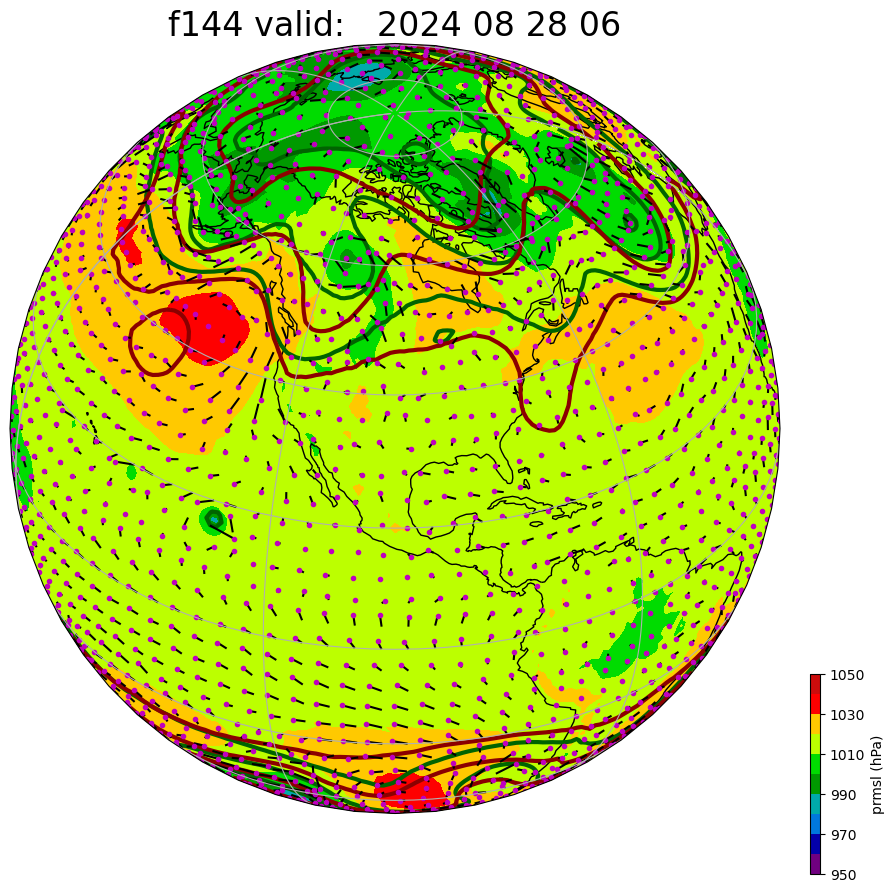

pngs/2024082206/f144.png


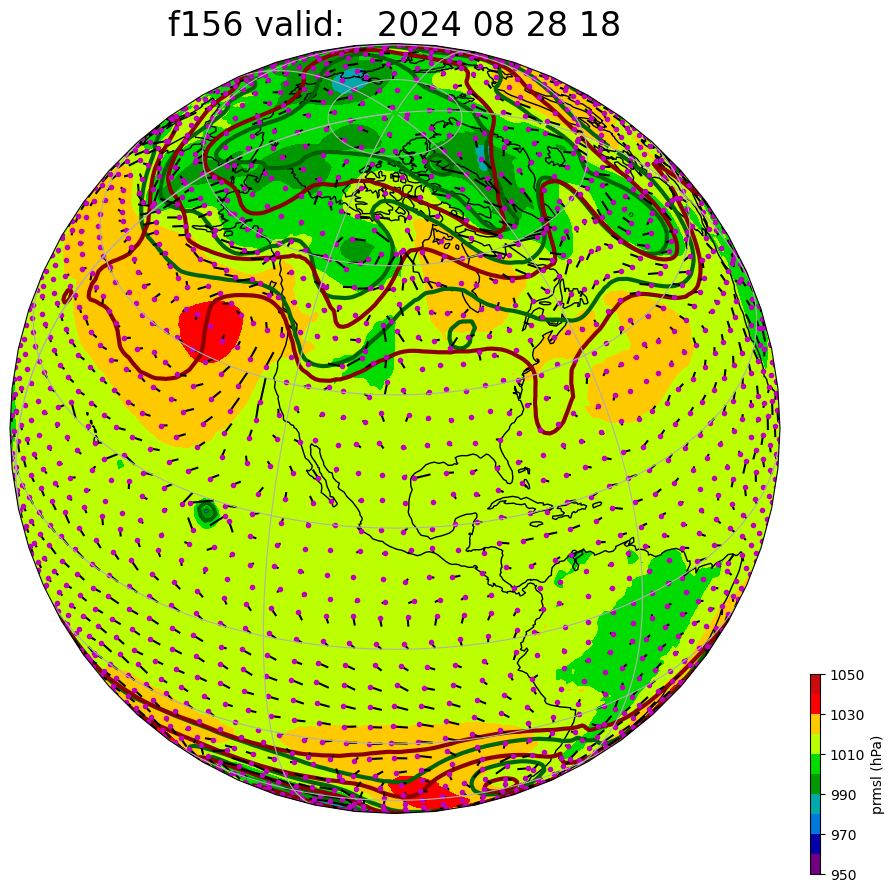

pngs/2024082206/f156.png


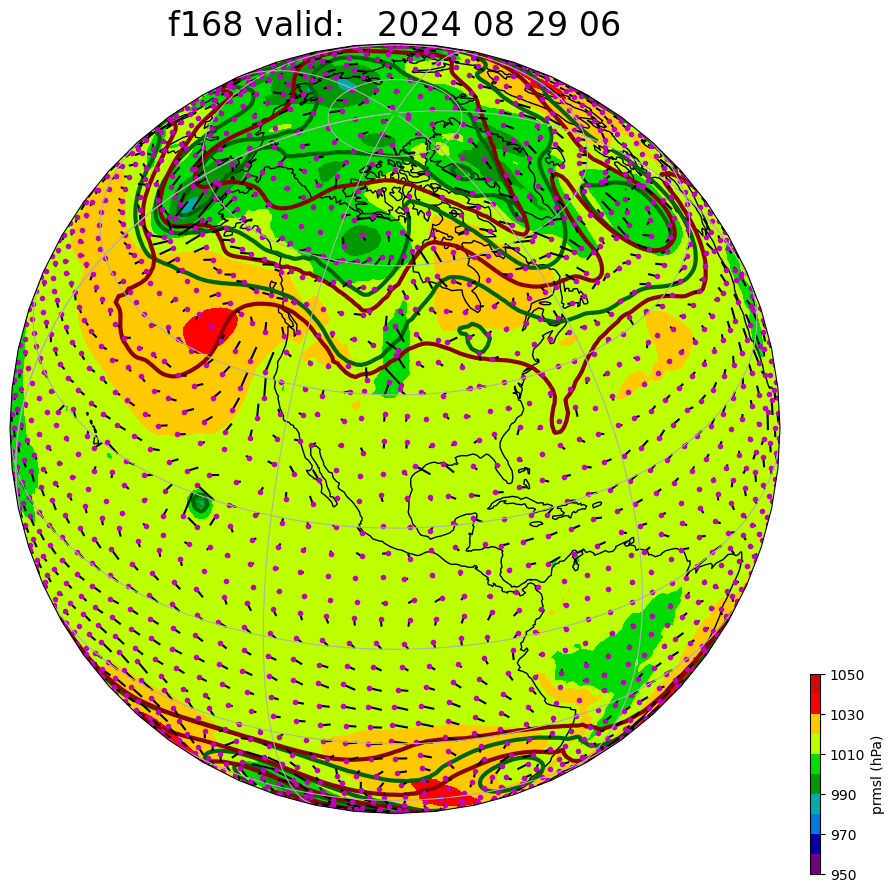

pngs/2024082206/f168.png


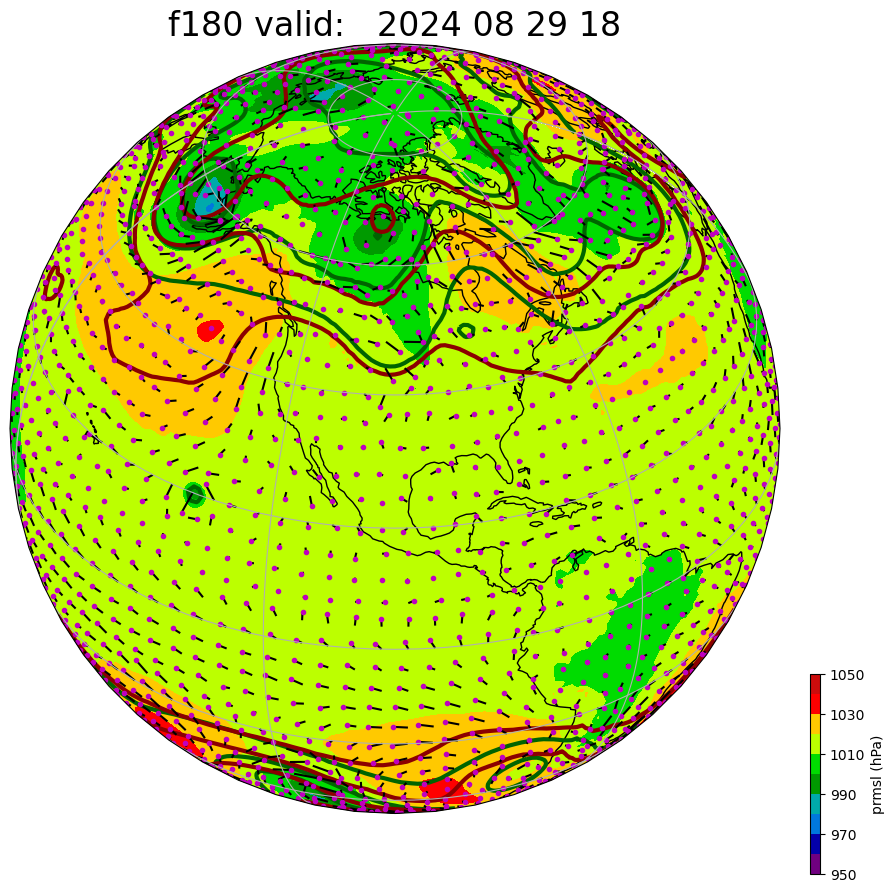

pngs/2024082206/f180.png


In [26]:
# make the cool plot for all forecast times
pngpaths=[]
for ftime in ftimes[0:]:
    p = my_cool_plot(ltime,ftime)
    print(p)
    pngpaths.append(p)

gfs1degnpy/2024082106/f000/lsm0.npy
successfully downloaded file at http://metrprof.xyz/gfs1degnpy/2024082106/f000/lsm0.npy
gfs1degnpy/2024082106/f000/u1.npy
successfully downloaded file at http://metrprof.xyz/gfs1degnpy/2024082106/f000/u1.npy
gfs1degnpy/2024082106/f000/v1.npy
successfully downloaded file at http://metrprof.xyz/gfs1degnpy/2024082106/f000/v1.npy
gfs1degnpy/2024082106/f000/t1.npy
successfully downloaded file at http://metrprof.xyz/gfs1degnpy/2024082106/f000/t1.npy
gfs1degnpy/2024082106/f000/u500.npy
successfully downloaded file at http://metrprof.xyz/gfs1degnpy/2024082106/f000/u500.npy
gfs1degnpy/2024082106/f000/v500.npy
successfully downloaded file at http://metrprof.xyz/gfs1degnpy/2024082106/f000/v500.npy
gfs1degnpy/2024082106/f000/gh500.npy
successfully downloaded file at http://metrprof.xyz/gfs1degnpy/2024082106/f000/gh500.npy
gfs1degnpy/2024082106/f000/gh200.npy
successfully downloaded file at http://metrprof.xyz/gfs1degnpy/2024082106/f000/gh200.npy
gfs1degnpy/20240

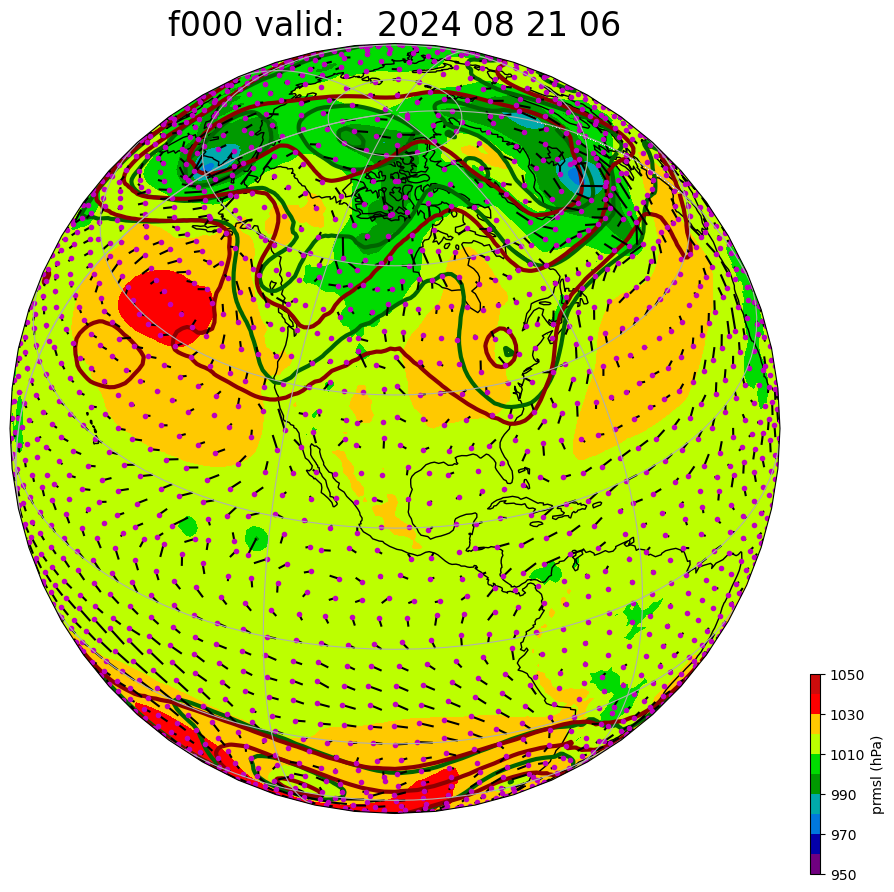

pngs/2024082106/f000.png
gfs1degnpy/2024082118/f000/lsm0.npy
successfully downloaded file at http://metrprof.xyz/gfs1degnpy/2024082118/f000/lsm0.npy
gfs1degnpy/2024082118/f000/u1.npy
successfully downloaded file at http://metrprof.xyz/gfs1degnpy/2024082118/f000/u1.npy
gfs1degnpy/2024082118/f000/v1.npy
successfully downloaded file at http://metrprof.xyz/gfs1degnpy/2024082118/f000/v1.npy
gfs1degnpy/2024082118/f000/t1.npy
successfully downloaded file at http://metrprof.xyz/gfs1degnpy/2024082118/f000/t1.npy
gfs1degnpy/2024082118/f000/u500.npy
successfully downloaded file at http://metrprof.xyz/gfs1degnpy/2024082118/f000/u500.npy
gfs1degnpy/2024082118/f000/v500.npy
successfully downloaded file at http://metrprof.xyz/gfs1degnpy/2024082118/f000/v500.npy
gfs1degnpy/2024082118/f000/gh500.npy
successfully downloaded file at http://metrprof.xyz/gfs1degnpy/2024082118/f000/gh500.npy
gfs1degnpy/2024082118/f000/gh200.npy
successfully downloaded file at http://metrprof.xyz/gfs1degnpy/2024082118/f000/g

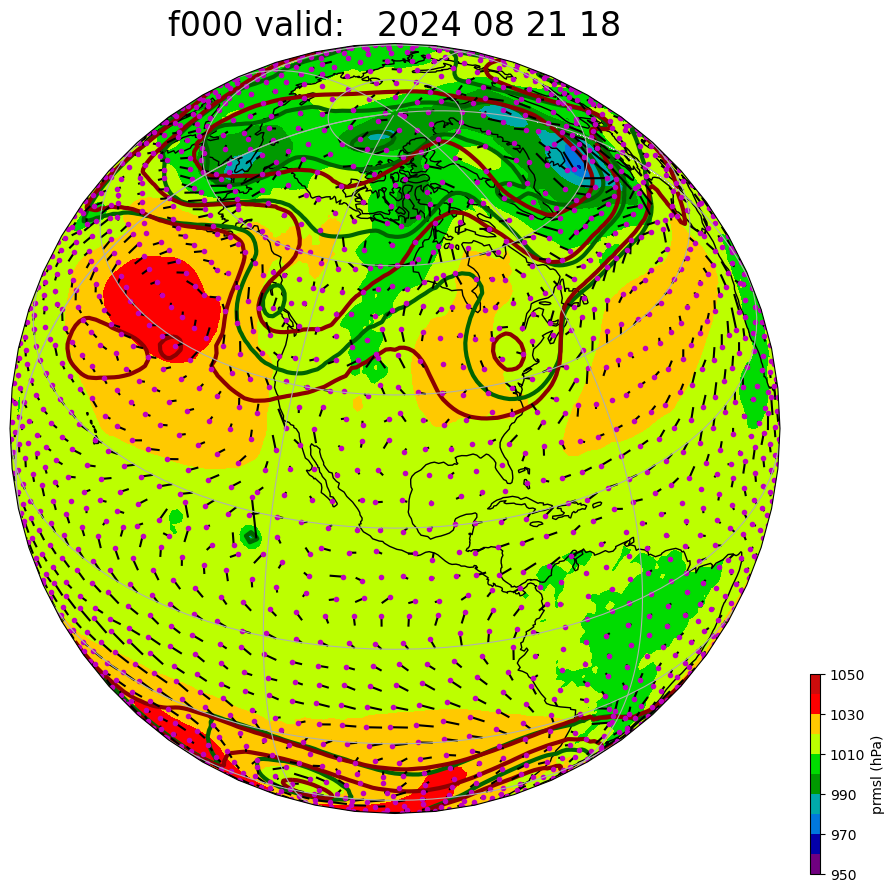

pngs/2024082118/f000.png


In [27]:
# Also plot some prior f000 analyses from past days.
# We grab and plot in one loop.
pngpriors=[]
ftime='f000'
for dhr in [-24,-12]:
    etime=uptime(ltime,dhr).strftime("%Y%m%d%H")
    timedir=etime
    if not timedir in gfs: gfs[timedir]={}
    for ftime in ['f000']:
        if not ftime in gfs[timedir]: gfs[timedir][ftime]={}
        for var in grids:
            npy = npydir + '/' + timedir +'/' + ftime + '/' + var+'.npy'
            print(npy)
            gfs[timedir][ftime][var] = gfsload(npy)
    print(etime)
    p = my_cool_plot(etime,ftime)
    print(p)
    pngpriors.append(p)

In [28]:
allpngs = pngpriors + pngpaths # all the pngs

In [29]:
n=0
nloopmax = 1 # change this to >0 to see animation
nloop = 0
while nloop<nloopmax:
    png = allpngs[n]
    if not os.path.exists(png):
        print("could not find:",png)  
        break
    n+=1
    if n>=len(allpngs):
        n = 0
        nloop+=1
    display(Image(filename=png))
    Time.sleep(1)
    clear_output(wait=True)
print("completed",nloop,"loops of animation")

completed 1 loops of animation


In [30]:
# If you are using Windows, we need to fix the filepaths before putting them into html
# See this procedure used in https://anaconda.org/bfiedler/griddeddata
pngsfixed = [x.replace('\\','/') for x in allpngs] # fixes Windows
print(allpngs)
print(pngsfixed)

['pngs/2024082106/f000.png', 'pngs/2024082118/f000.png', 'pngs/2024082206/f000.png', 'pngs/2024082206/f012.png', 'pngs/2024082206/f024.png', 'pngs/2024082206/f036.png', 'pngs/2024082206/f048.png', 'pngs/2024082206/f060.png', 'pngs/2024082206/f072.png', 'pngs/2024082206/f084.png', 'pngs/2024082206/f096.png', 'pngs/2024082206/f108.png', 'pngs/2024082206/f120.png', 'pngs/2024082206/f132.png', 'pngs/2024082206/f144.png', 'pngs/2024082206/f156.png', 'pngs/2024082206/f168.png', 'pngs/2024082206/f180.png']
['pngs/2024082106/f000.png', 'pngs/2024082118/f000.png', 'pngs/2024082206/f000.png', 'pngs/2024082206/f012.png', 'pngs/2024082206/f024.png', 'pngs/2024082206/f036.png', 'pngs/2024082206/f048.png', 'pngs/2024082206/f060.png', 'pngs/2024082206/f072.png', 'pngs/2024082206/f084.png', 'pngs/2024082206/f096.png', 'pngs/2024082206/f108.png', 'pngs/2024082206/f120.png', 'pngs/2024082206/f132.png', 'pngs/2024082206/f144.png', 'pngs/2024082206/f156.png', 'pngs/2024082206/f168.png', 'pngs/2024082206/f

In [31]:
janim.makeanim(pngsfixed,outfile="GFSanimator.html",sortOrder=True,ctlOnSide=True,titlestring="GFS animation")

# Now view your animation in your browser

Open [GFSanimator.html](GFSanimator.html) in your browser.

<hr style="height:30px;border:none;background-color:#f00;" />

# Student Task 

Make a useful animated, mapped forecast product, focused somewhere other than Oklahoma.

One of the plotted variables must be about precipitation.

Make sure you explicitly set the contour levels, and that the levels can be understood by the viewer.

Put the animation on your site, as you did for the animation in `GriddedData.ipynb`.

Unfortunately, your forecast product will quickly becomes obsolete, because it is not automatically updated.


<hr style="height:30px;border:none;background-color:#00f;" />

# Appendix

## Why I don't trust quiver

First there is this, even for vectors in a plane:

https://stackoverflow.com/questions/37154071/python-quiver-plot-without-head

I set u=0 and v=10 at all points.  Even after making headless quiver arrows, we see these vectors cannot be interpreted as displacement vectors (for a set unit of time). Notice how the vectors are not foreshortened (if that is the right word) at the limb.  The vectors cannot be interpreted as displacement vectors painted on the globe. The vectors should not be touching each other. The relative length of vector and white space gap should be same. 

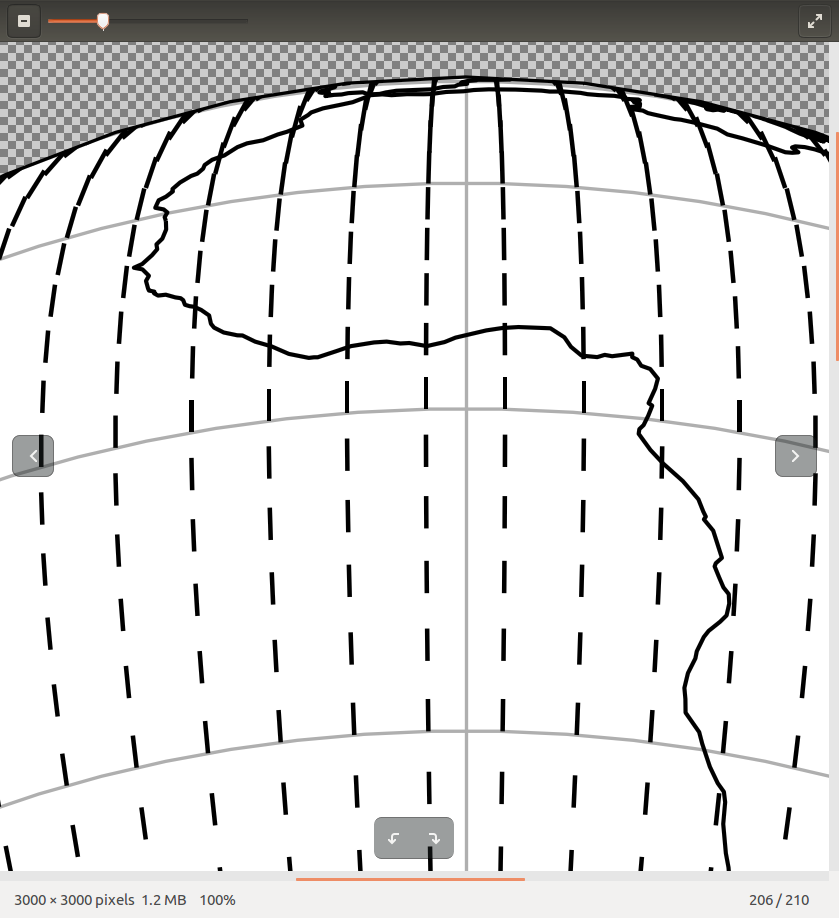

I don't see a fix in the [quiver docs](https://matplotlib.org/3.5.0/api/_as_gen/matplotlib.axes.Axes.quiver.html).




## my method 
If we can plot short line segments on our Earth,  plotting vectors is easy, and reliable.  Here is my method, without the red dot "head":


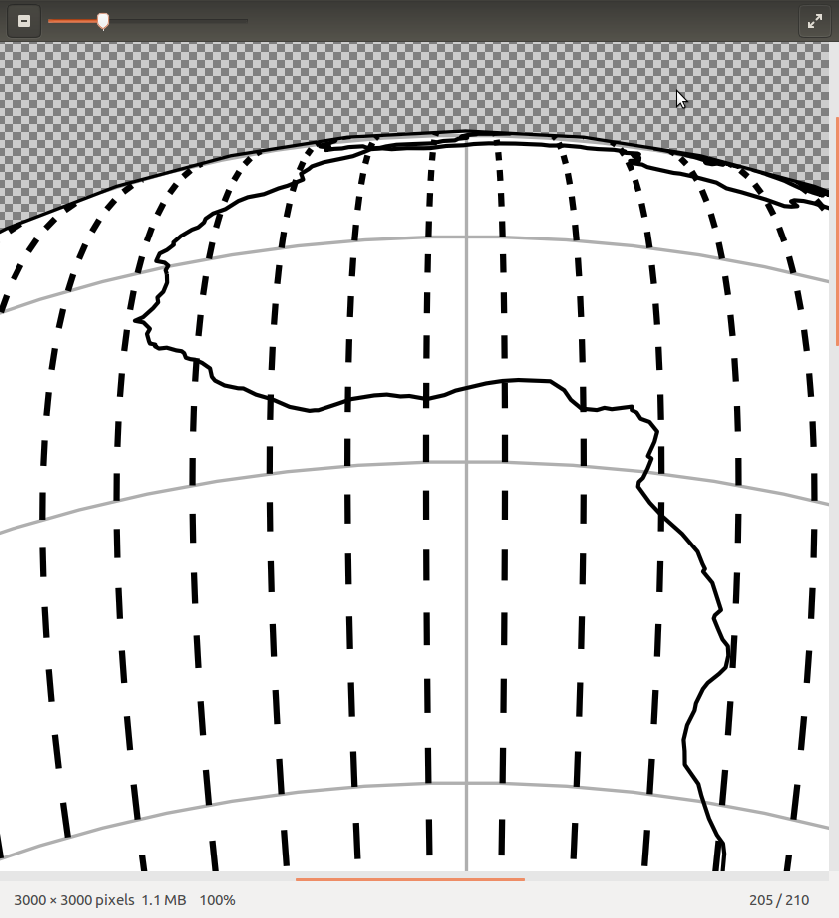

## Server side programs

If you want to know how I offer the Grib data as .npy files on my server:

### My cronscript:

```
05 * * * * /home/bfiedler/grib/todaygrab.py  >/home/bfiedler/cronscripts/cron.out 2>/home/bfiedler/cronscripts/cron.err 
0 0 * * * /home/bfiedler/grib/gribclean.py  >/home/bfiedler/cronscripts/clean.out 2>/home/bfiedler/cronscripts/clean.err 
```
Below are the 4 server-side python programs that make extract selected latest GFS Grib data into .npy files at my http://metrprof.xyz/gfs1degnpy/